In [1]:
import os 
os.chdir("..")
from src.cpwc.multires.class_multiressolver import *
import matplotlib.pyplot as plt
import torch
from src.cpwc.tools.ptychography import Ptychography as Ptychography
from src.cpwc.tools.utils import *
torch.cuda.empty_cache()

# Set seeds 
torch.manual_seed(0)
np.random.seed(0)

/home/efe/Desktop/Multiresolution-Framework-for-Fourier-Ptychography/.venv/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
import gc
for obj in gc.get_objects():
    try:
        if torch.is_tensor(obj) and obj.is_cuda:
            print(type(obj), obj.size())
    except Exception:
        pass

/home/efe/Desktop/Multiresolution-Framework-for-Fourier-Ptychography/.venv/lib/python3.8/site-packages/torch/distributed/distributed_c10d.py:181: UserWarning: torch.distributed.reduce_op is deprecated, please use torch.distributed.ReduceOp instead
  warnings.warn(


In [3]:
max_scale = 9
max_probe_size = 128
max_shift = 64
device = 'cuda'
I_in = 15*np.array([1, 15, 10, 5, 10, 30, 100])
I_out = 10*np.array([0, 0, 0, 30, 30,40,300])
cycle = [0, -1, -1, -1,  1, 1, 1]
lmbda = 0
LR = 1e-2
tol = [1e-10] * 9
tol_in = [1e-10] * 9

linOperator = Ptychography(max_scale = max_scale,max_probe_size = max_probe_size ,max_shift = max_shift,device=device)
noise_level = 1000
image = plt.imread('test_data/peppers.jpg')/ 255
image_tensor = torch.tensor(image).double().to(device).view(1, 1, 2**max_scale, 2**max_scale)
image_tensor_ = torch.exp(1j * image_tensor)

multires = MultiRes(max_scale, device)
image_tensor_ = linOperator.apply(image_tensor_)
image_tensor_ = np.random.poisson(image_tensor_.cpu().detach() * noise_level) / noise_level
image_tensor_ = torch.tensor(image_tensor_).to(torch.complex64).to(device)


loss = Loss(linOperator,image_tensor_)
model1 = MultiResSolver(multires, loss, LR = LR,
                        I_in = I_in,
                        I_out = I_out,
                        tol = tol,
                        tol_in = tol_in,
                        cycle = cycle,
                        l1_type = "l1_row")

model1.solve_multigrid()
model1.print_time()

----------- s = 9 -----------
----------- s = 8 -----------
----------- s = 7 -----------
----------- s = 6 -----------
Iter 1, [loss, mse, reg, rel_loss, LR] : [129006.6064261, 129006.6064261, 0.5110912, 0.01] 
Iter 2, [loss, mse, reg, rel_loss, LR] : [63072.464417, 63072.464417, 0.3409481, 0.01] 
Iter 3, [loss, mse, reg, rel_loss, LR] : [41568.0249864, 41568.0249864, 0.1987842, 0.01] 
Iter 4, [loss, mse, reg, rel_loss, LR] : [33304.9593369, 33304.9593369, 0.0900963, 0.01] 
Iter 5, [loss, mse, reg, rel_loss, LR] : [30304.305208, 30304.305208, 0.1024889, 0.01] 
Iter 6, [loss, mse, reg, rel_loss, LR] : [27198.4494248, 27198.4494248, 0.1367363, 0.01] 
Iter 7, [loss, mse, reg, rel_loss, LR] : [23479.432927, 23479.432927, 0.1629934, 0.01] 
Iter 8, [loss, mse, reg, rel_loss, LR] : [19652.440747, 19652.440747, 0.1303592, 0.01] 
Iter 9, [loss, mse, reg, rel_loss, LR] : [17090.5634879, 17090.5634879, 0.0505446, 0.01] 
Iter 10, [loss, mse, reg, rel_loss, LR] : [16226.7278524, 16226.7278524, 0.0

In [4]:
max_scale = 9
max_probe_size = 128
max_shift = 64
device = 'cuda'
I_in = 15*np.array([1, 15, 10, 5, 10, 30, 100])
I_out = 10*np.array([0, 0, 0, 0, 0,0,400])
cycle = [0, -1, -1, -1,  1, 1, 1]
lmbda = 0
LR = 1e-2
tol = [1e-10] * 9
tol_in = [1e-10] * 9

linOperator = Ptychography(max_scale = max_scale,max_probe_size = max_probe_size ,max_shift = max_shift,device=device)
noise_level = 1000
image = plt.imread('test_data/peppers.jpg')/ 255
image_tensor = torch.tensor(image).double().to(device).view(1, 1, 2**max_scale, 2**max_scale)
image_tensor_ = torch.exp(1j * image_tensor)

multires = MultiRes(max_scale, device)
image_tensor_ = linOperator.apply(image_tensor_)
image_tensor_ = np.random.poisson(image_tensor_.cpu().detach() * noise_level) / noise_level
image_tensor_ = torch.tensor(image_tensor_).to(torch.complex64).to(device)


loss = Loss(linOperator,image_tensor_)
model2 = MultiResSolver(multires, loss, LR = LR,
                        I_in = I_in,
                        I_out = I_out,
                        tol = tol,
                        tol_in = tol_in,
                        cycle = cycle,
                        l1_type = "l1_row")

model2.solve_multigrid()
model2.print_time()

----------- s = 9 -----------
----------- s = 8 -----------
----------- s = 7 -----------
----------- s = 6 -----------
----------- s = 7 -----------
----------- s = 8 -----------
----------- s = 9 -----------
Iter 1, [loss, mse, reg, rel_loss, LR] : [129071.2914413, 129071.2914413, 0.0099082, 0.01] 
Iter 2, [loss, mse, reg, rel_loss, LR] : [127792.4297437, 127792.4297437, 0.0123061, 0.01] 
Iter 3, [loss, mse, reg, rel_loss, LR] : [126219.7975817, 126219.7975817, 0.0168746, 0.01] 
Iter 4, [loss, mse, reg, rel_loss, LR] : [124089.8871591, 124089.8871591, 0.0213476, 0.01] 
Iter 5, [loss, mse, reg, rel_loss, LR] : [121440.8612023, 121440.8612023, 0.0257187, 0.01] 
Iter 6, [loss, mse, reg, rel_loss, LR] : [118317.5597503, 118317.5597503, 0.0300068, 0.01] 
Iter 7, [loss, mse, reg, rel_loss, LR] : [114767.2336254, 114767.2336254, 0.0342121, 0.01] 
Iter 8, [loss, mse, reg, rel_loss, LR] : [110840.8033266, 110840.8033266, 0.0383414, 0.01] 
Iter 9, [loss, mse, reg, rel_loss, LR] : [106591.01153

In [5]:
max_scale = 9
max_probe_size = 128
max_shift = 64
device = 'cuda'
I_in = 15*np.array([1, 15, 10, 5, 10, 30, 100])
I_out = 10*np.array([0, 0, 0, 30, 30,40,300])
cycle = [0, -1, -1, -1,  1, 1, 1]
lmbda = 0
LR = 1e-2
tol = [1e-10] * 9
tol_in = [1e-10] * 9

linOperator = Ptychography(max_scale = max_scale,max_probe_size = max_probe_size ,max_shift = max_shift,device=device)
noise_level = 100
image = plt.imread('test_data/peppers.jpg')/ 255
image_tensor = torch.tensor(image).double().to(device).view(1, 1, 2**max_scale, 2**max_scale)
image_tensor_ = torch.exp(1j * image_tensor)

multires = MultiRes(max_scale, device)
image_tensor_ = linOperator.apply(image_tensor_)
image_tensor_ = np.random.poisson(image_tensor_.cpu().detach() * noise_level) / noise_level
image_tensor_ = torch.tensor(image_tensor_).to(torch.complex64).to(device)


loss = Loss(linOperator,image_tensor_)
model3 = MultiResSolver(multires, loss, LR = LR,
                        I_in = I_in,
                        I_out = I_out,
                        tol = tol,
                        tol_in = tol_in,
                        cycle = cycle,
                        l1_type = "l1_row")

model3.solve_multigrid()
model3.print_time()

----------- s = 9 -----------
----------- s = 8 -----------
----------- s = 7 -----------
----------- s = 6 -----------
Iter 1, [loss, mse, reg, rel_loss, LR] : [129151.3084185, 129151.3084185, 0.5269087, 0.01] 
Iter 2, [loss, mse, reg, rel_loss, LR] : [61100.3630666, 61100.3630666, 0.3826402, 0.01] 
Iter 3, [loss, mse, reg, rel_loss, LR] : [37720.9070321, 37720.9070321, 0.2278526, 0.01] 
Iter 4, [loss, mse, reg, rel_loss, LR] : [29126.1016629, 29126.1016629, 0.079233, 0.01] 
Iter 5, [loss, mse, reg, rel_loss, LR] : [26818.3539579, 26818.3539579, 0.0755039, 0.01] 
Iter 6, [loss, mse, reg, rel_loss, LR] : [24793.4630598, 24793.4630598, 0.0932845, 0.01] 
Iter 7, [loss, mse, reg, rel_loss, LR] : [22480.6165418, 22480.6165418, 0.1008115, 0.01] 
Iter 8, [loss, mse, reg, rel_loss, LR] : [20214.3116286, 20214.3116286, 0.0997449, 0.01] 
Iter 9, [loss, mse, reg, rel_loss, LR] : [18198.0380339, 18198.0380339, 0.0731316, 0.01] 
Iter 10, [loss, mse, reg, rel_loss, LR] : [16867.1867889, 16867.18678

In [6]:
max_scale = 9
max_probe_size = 128
max_shift = 64
device = 'cuda'
I_in = 15*np.array([1, 15, 10, 5, 10, 30, 100])
I_out = 10*np.array([0, 0, 0, 0, 0,0,400])
cycle = [0, -1, -1, -1,  1, 1, 1]
lmbda = 0
LR = 1e-2
tol = [1e-10] * 9
tol_in = [1e-10] * 9

linOperator = Ptychography(max_scale = max_scale,max_probe_size = max_probe_size ,max_shift = max_shift,device=device)
noise_level = 100
image = plt.imread('test_data/peppers.jpg')/ 255
image_tensor = torch.tensor(image).double().to(device).view(1, 1, 2**max_scale, 2**max_scale)
image_tensor_ = torch.exp(1j * image_tensor)

multires = MultiRes(max_scale, device)
image_tensor_ = linOperator.apply(image_tensor_)
image_tensor_ = np.random.poisson(image_tensor_.cpu().detach() * noise_level) / noise_level
image_tensor_ = torch.tensor(image_tensor_).to(torch.complex64).to(device)


loss = Loss(linOperator,image_tensor_)
model4 = MultiResSolver(multires, loss, LR = LR,
                        I_in = I_in,
                        I_out = I_out,
                        tol = tol,
                        tol_in = tol_in,
                        cycle = cycle,
                        l1_type = "l1_row")

model4.solve_multigrid()
model4.print_time()

----------- s = 9 -----------
----------- s = 8 -----------
----------- s = 7 -----------
----------- s = 6 -----------
----------- s = 7 -----------
----------- s = 8 -----------
----------- s = 9 -----------
Iter 1, [loss, mse, reg, rel_loss, LR] : [129071.7320822, 129071.7320822, 0.0094933, 0.01] 
Iter 2, [loss, mse, reg, rel_loss, LR] : [127846.4207937, 127846.4207937, 0.0112839, 0.01] 
Iter 3, [loss, mse, reg, rel_loss, LR] : [126403.8178597, 126403.8178597, 0.0155129, 0.01] 
Iter 4, [loss, mse, reg, rel_loss, LR] : [124442.9338661, 124442.9338661, 0.0196987, 0.01] 
Iter 5, [loss, mse, reg, rel_loss, LR] : [121991.5691076, 121991.5691076, 0.0237866, 0.01] 
Iter 6, [loss, mse, reg, rel_loss, LR] : [119089.8101516, 119089.8101516, 0.0277808, 0.01] 
Iter 7, [loss, mse, reg, rel_loss, LR] : [115781.4006602, 115781.4006602, 0.0316688, 0.01] 
Iter 8, [loss, mse, reg, rel_loss, LR] : [112114.7393575, 112114.7393575, 0.0354538, 0.01] 
Iter 9, [loss, mse, reg, rel_loss, LR] : [108139.84129

In [7]:
max_scale = 9
max_probe_size = 128
max_shift = 64
device = 'cuda'
I_in = 15*np.array([1, 15, 10, 5, 10, 30, 100])
I_out = 10*np.array([0, 0, 0, 30, 30,40,300])
cycle = [0, -1, -1, -1,  1, 1, 1]
lmbda = 0
LR = 1e-2
tol = [1e-10] * 9
tol_in = [1e-10] * 9

linOperator = Ptychography(max_scale = max_scale,max_probe_size = max_probe_size ,max_shift = max_shift,device=device)
noise_level = 10
image = plt.imread('test_data/peppers.jpg')/ 255
image_tensor = torch.tensor(image).double().to(device).view(1, 1, 2**max_scale, 2**max_scale)
image_tensor_ = torch.exp(1j * image_tensor)

multires = MultiRes(max_scale, device)
image_tensor_ = linOperator.apply(image_tensor_)
image_tensor_ = np.random.poisson(image_tensor_.cpu().detach() * noise_level) / noise_level
image_tensor_ = torch.tensor(image_tensor_).to(torch.complex64).to(device)


loss = Loss(linOperator,image_tensor_)
model5 = MultiResSolver(multires, loss, LR = LR,
                        I_in = I_in,
                        I_out = I_out,
                        tol = tol,
                        tol_in = tol_in,
                        cycle = cycle,
                        l1_type = "l1_row")

model5.solve_multigrid()
model5.print_time()

----------- s = 9 -----------
----------- s = 8 -----------
----------- s = 7 -----------
----------- s = 6 -----------
Iter 1, [loss, mse, reg, rel_loss, LR] : [129349.8565789, 129349.8565789, 0.5170102, 0.01] 
Iter 2, [loss, mse, reg, rel_loss, LR] : [62474.6633722, 62474.6633722, 0.3756374, 0.01] 
Iter 3, [loss, mse, reg, rel_loss, LR] : [39006.8453093, 39006.8453093, 0.2408371, 0.01] 
Iter 4, [loss, mse, reg, rel_loss, LR] : [29612.5490979, 29612.5490979, 0.1333024, 0.01] 
Iter 5, [loss, mse, reg, rel_loss, LR] : [25665.1246393, 25665.1246393, 0.1151994, 0.01] 
Iter 6, [loss, mse, reg, rel_loss, LR] : [22708.5176079, 22708.5176079, 0.082327, 0.01] 
Iter 7, [loss, mse, reg, rel_loss, LR] : [20838.9945581, 20838.9945581, 0.0285235, 0.01] 
Iter 8, [loss, mse, reg, rel_loss, LR] : [20244.5938333, 20244.5938333, 0.0141691, 0.01] 
Iter 9, [loss, mse, reg, rel_loss, LR] : [19957.7466359, 19957.7466359, 0.0352214, 0.01] 
Iter 10, [loss, mse, reg, rel_loss, LR] : [19254.8076789, 19254.80767

In [8]:
max_scale = 9
max_probe_size = 128
max_shift = 64
device = 'cuda'
I_in = 15*np.array([1, 15, 10, 5, 10, 30, 100])
I_out = 10*np.array([0, 0, 0, 0, 0,0,400])
cycle = [0, -1, -1, -1,  1, 1, 1]
lmbda = 0
LR = 1e-2
tol = [1e-10] * 9
tol_in = [1e-10] * 9

linOperator = Ptychography(max_scale = max_scale,max_probe_size = max_probe_size ,max_shift = max_shift,device=device)
noise_level = 10
image = plt.imread('test_data/peppers.jpg')/ 255
image_tensor = torch.tensor(image).double().to(device).view(1, 1, 2**max_scale, 2**max_scale)
image_tensor_ = torch.exp(1j * image_tensor)

multires = MultiRes(max_scale, device)
image_tensor_ = linOperator.apply(image_tensor_)
image_tensor_ = np.random.poisson(image_tensor_.cpu().detach() * noise_level) / noise_level
image_tensor_ = torch.tensor(image_tensor_).to(torch.complex64).to(device)


loss = Loss(linOperator,image_tensor_)
model6 = MultiResSolver(multires, loss, LR = LR,
                        I_in = I_in,
                        I_out = I_out,
                        tol = tol,
                        tol_in = tol_in,
                        cycle = cycle,
                        l1_type = "l1_row")

model6.solve_multigrid()
model6.print_time()

----------- s = 9 -----------
----------- s = 8 -----------
----------- s = 7 -----------
----------- s = 6 -----------
----------- s = 7 -----------
----------- s = 8 -----------
----------- s = 9 -----------
Iter 1, [loss, mse, reg, rel_loss, LR] : [129305.533686, 129305.533686, 0.0097995, 0.01] 
Iter 2, [loss, mse, reg, rel_loss, LR] : [128038.4101966, 128038.4101966, 0.0119453, 0.01] 
Iter 3, [loss, mse, reg, rel_loss, LR] : [126508.9469398, 126508.9469398, 0.0163916, 0.01] 
Iter 4, [loss, mse, reg, rel_loss, LR] : [124435.264322, 124435.264322, 0.0207637, 0.01] 
Iter 5, [loss, mse, reg, rel_loss, LR] : [121851.5216916, 121851.5216916, 0.0250602, 0.01] 
Iter 6, [loss, mse, reg, rel_loss, LR] : [118797.8949499, 118797.8949499, 0.0292904, 0.01] 
Iter 7, [loss, mse, reg, rel_loss, LR] : [115318.2616757, 115318.2616757, 0.033494, 0.01] 
Iter 8, [loss, mse, reg, rel_loss, LR] : [111455.787171, 111455.787171, 0.0376821, 0.01] 
Iter 9, [loss, mse, reg, rel_loss, LR] : [107255.894141, 1072

In [9]:
max_scale = 9
max_probe_size = 128
max_shift = 64
device = 'cuda'
I_in = 15*np.array([1, 15, 10, 5, 10, 30, 100])
I_out = 10*np.array([0, 0, 0, 30, 30,40,300])
cycle = [0, -1, -1, -1,  1, 1, 1]
lmbda = 0
LR = 1e-2
tol = [1e-10] * 9
tol_in = [1e-10] * 9

linOperator = Ptychography(max_scale = max_scale,max_probe_size = max_probe_size ,max_shift = max_shift,device=device)
noise_level = 1
image = plt.imread('test_data/peppers.jpg')/ 255
image_tensor = torch.tensor(image).double().to(device).view(1, 1, 2**max_scale, 2**max_scale)
image_tensor_ = torch.exp(1j * image_tensor)

multires = MultiRes(max_scale, device)
image_tensor_ = linOperator.apply(image_tensor_)
image_tensor_ = np.random.poisson(image_tensor_.cpu().detach() * noise_level) / noise_level
image_tensor_ = torch.tensor(image_tensor_).to(torch.complex64).to(device)


loss = Loss(linOperator,image_tensor_)
model7 = MultiResSolver(multires, loss, LR = LR,
                        I_in = I_in,
                        I_out = I_out,
                        tol = tol,
                        tol_in = tol_in,
                        cycle = cycle,
                        l1_type = "l1_row")

model7.solve_multigrid()
model7.print_time()

----------- s = 9 -----------
----------- s = 8 -----------
----------- s = 7 -----------
----------- s = 6 -----------
Iter 1, [loss, mse, reg, rel_loss, LR] : [129443.2671841, 129443.2671841, 0.4393292, 0.01] 
Iter 2, [loss, mse, reg, rel_loss, LR] : [72575.0544537, 72575.0544537, 0.3034798, 0.01] 
Iter 3, [loss, mse, reg, rel_loss, LR] : [50549.9935409, 50549.9935409, 0.1643849, 0.01] 
Iter 4, [loss, mse, reg, rel_loss, LR] : [42240.3373599, 42240.3373599, 0.060504, 0.01] 
Iter 5, [loss, mse, reg, rel_loss, LR] : [39684.6286369, 39684.6286369, 0.0737806, 0.01] 
Iter 6, [loss, mse, reg, rel_loss, LR] : [36756.6749071, 36756.6749071, 0.099132, 0.01] 
Iter 7, [loss, mse, reg, rel_loss, LR] : [33112.9128042, 33112.9128042, 0.0810617, 0.01] 
Iter 8, [loss, mse, reg, rel_loss, LR] : [30428.7247622, 30428.7247622, 0.0560075, 0.01] 
Iter 9, [loss, mse, reg, rel_loss, LR] : [28724.4878412, 28724.4878412, 0.0628148, 0.01] 
Iter 10, [loss, mse, reg, rel_loss, LR] : [26920.1655851, 26920.165585

In [10]:
max_scale = 9
max_probe_size = 128
max_shift = 64
device = 'cuda'
I_in = 15*np.array([1, 15, 10, 5, 10, 30, 100])
I_out = 10*np.array([0, 0, 0, 0, 0,0,400])
cycle = [0, -1, -1, -1,  1, 1, 1]
lmbda = 0
LR = 1e-2
tol = [1e-10] * 9
tol_in = [1e-10] * 9

linOperator = Ptychography(max_scale = max_scale,max_probe_size = max_probe_size ,max_shift = max_shift,device=device)
noise_level = 1
image = plt.imread('test_data/peppers.jpg')/ 255
image_tensor = torch.tensor(image).double().to(device).view(1, 1, 2**max_scale, 2**max_scale)
image_tensor_ = torch.exp(1j * image_tensor)

multires = MultiRes(max_scale, device)
image_tensor_ = linOperator.apply(image_tensor_)
image_tensor_ = np.random.poisson(image_tensor_.cpu().detach() * noise_level) / noise_level
image_tensor_ = torch.tensor(image_tensor_).to(torch.complex64).to(device)


loss = Loss(linOperator,image_tensor_)
model8 = MultiResSolver(multires, loss, LR = LR,
                        I_in = I_in,
                        I_out = I_out,
                        tol = tol,
                        tol_in = tol_in,
                        cycle = cycle,
                        l1_type = "l1_row")

model8.solve_multigrid()
model8.print_time()

----------- s = 9 -----------
----------- s = 8 -----------
----------- s = 7 -----------
----------- s = 6 -----------
----------- s = 7 -----------
----------- s = 8 -----------
----------- s = 9 -----------
Iter 1, [loss, mse, reg, rel_loss, LR] : [129942.0175768, 129942.0175768, 0.0088999, 0.01] 
Iter 2, [loss, mse, reg, rel_loss, LR] : [128785.5525972, 128785.5525972, 0.0109507, 0.01] 
Iter 3, [loss, mse, reg, rel_loss, LR] : [127375.2613406, 127375.2613406, 0.0149376, 0.01] 
Iter 4, [loss, mse, reg, rel_loss, LR] : [125472.5783805, 125472.5783805, 0.0188406, 0.01] 
Iter 5, [loss, mse, reg, rel_loss, LR] : [123108.5995166, 123108.5995166, 0.0226755, 0.01] 
Iter 6, [loss, mse, reg, rel_loss, LR] : [120317.055875, 120317.055875, 0.0264324, 0.01] 
Iter 7, [loss, mse, reg, rel_loss, LR] : [117136.7851833, 117136.7851833, 0.0300936, 0.01] 
Iter 8, [loss, mse, reg, rel_loss, LR] : [113611.7129239, 113611.7129239, 0.0336634, 0.01] 
Iter 9, [loss, mse, reg, rel_loss, LR] : [109787.1562294

0.0006575015672963765


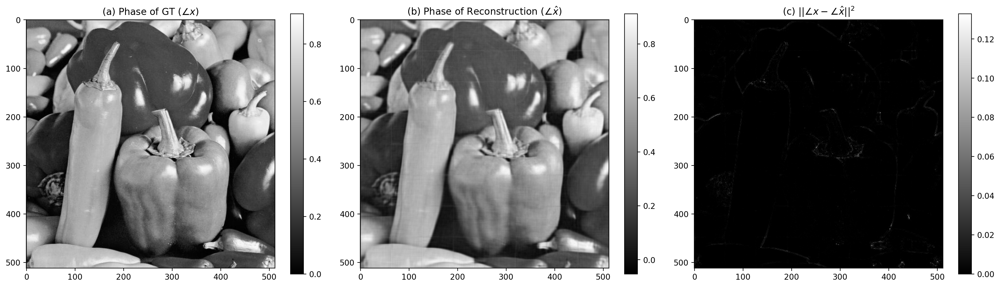

In [11]:
def unwrap_2d(phase):
    """
    Unwraps a 2D phase array using NumPy's 1D unwrap function.
    
    Parameters:
    phase (numpy array): The 2D phase array to be unwrapped.
    
    Returns:
    unwrapped_phase (numpy array): The 2D unwrapped phase array.
    """
    # Unwrap along the first axis (rows)
    unwrapped_phase = np.unwrap(phase, axis=0)
    
    # Unwrap along the second axis (columns)
    unwrapped_phase = np.unwrap(unwrapped_phase, axis=1)
    
    return unwrapped_phase

def plot_results(model,image):
    plt.figure(figsize=(18, 5),dpi = 200)    
    image = image[::,::]
    mean_img = np.mean(image)
    plt.subplot(1, 3, 1)
    plt.imshow(image,cmap='gray')
    plt.title(r"(a) Phase of GT $(\angle x)$")
    plt.colorbar()


    plt.subplot(1, 3, 2)
    phase = torch.angle(model.c_k[0,0,:,:].to('cpu'))
    phase = phase.numpy()
    phase = unwrap_2d(phase)
    phase += (mean_img-np.mean(phase))
    
    #phase = (phase - np.min(phase))/(np.max(phase) - np.min(phase))
    plt.imshow(phase,cmap = 'gray')
    plt.title(r"(b) Phase of Reconstruction $(\angle \hat{x})$")
    plt.colorbar()


    plt.subplot(1, 3, 3)
    error = np.abs(np.array(image)-np.array(phase))**2
    plt.imshow(error,cmap='gray')
    plt.title(r"(c) $||\angle x - \angle \hat{x}||^2$")
    plt.colorbar()
    plt.tight_layout()
    #plt.savefig("n_figs/new_result_img.png")
    #plt.savefig("n_figs/new_result_img.eps")
    mean_error = np.mean(error)
    print(mean_error)
    return None 

plot_results(model1,image)

0.0007071772265379125


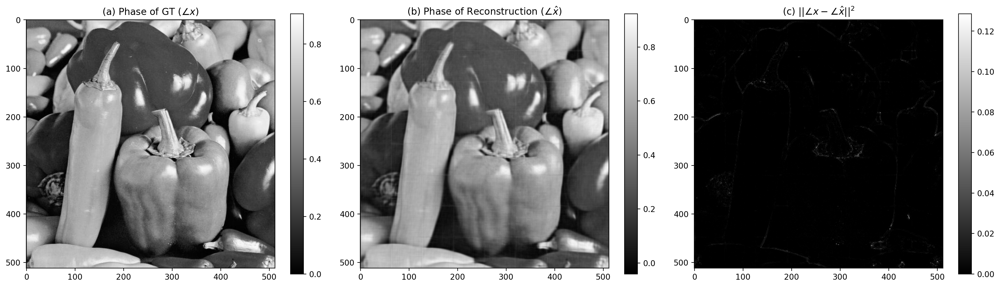

In [12]:
plot_results(model2,image)

0.0018981690178624703


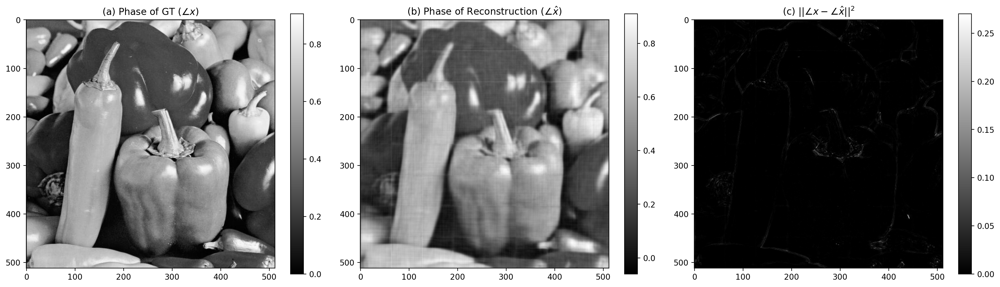

In [13]:
plot_results(model3,image)

0.002391191384241495


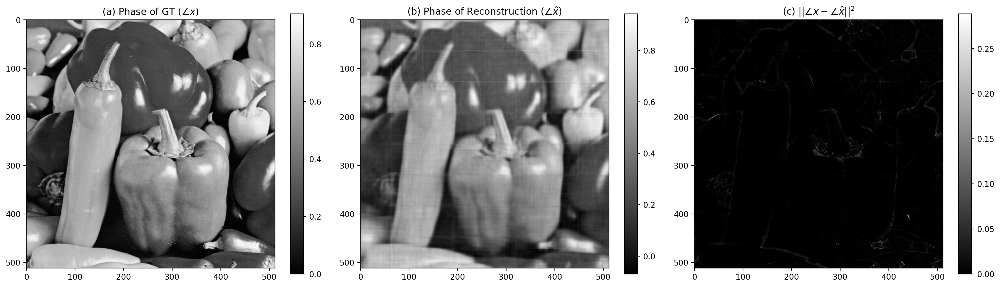

In [14]:
plot_results(model4,image)

0.004909739408494425


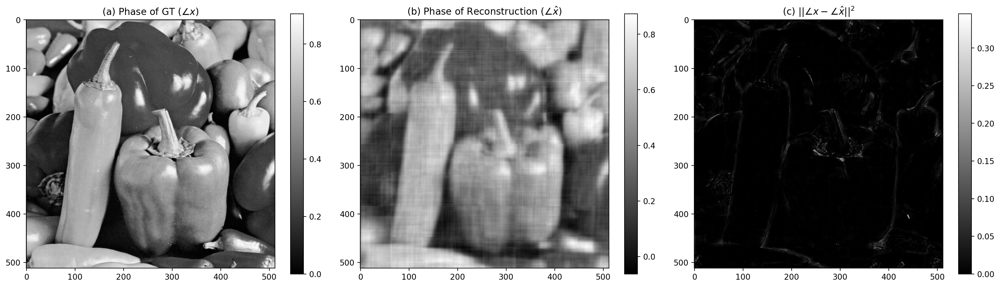

In [15]:
plot_results(model5,image)

0.005070232348039862


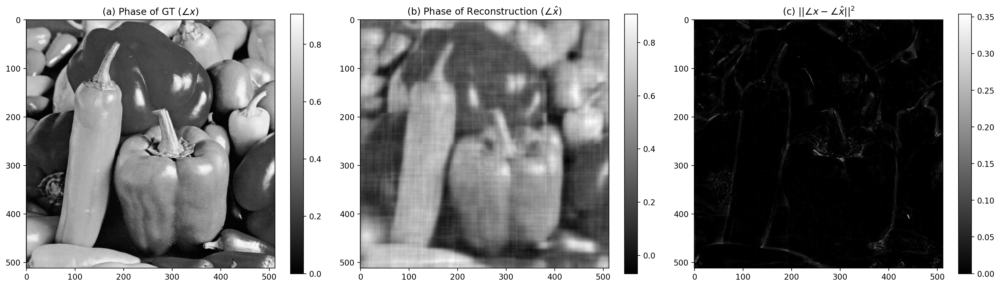

In [16]:
plot_results(model6,image)

0.011395460307022662


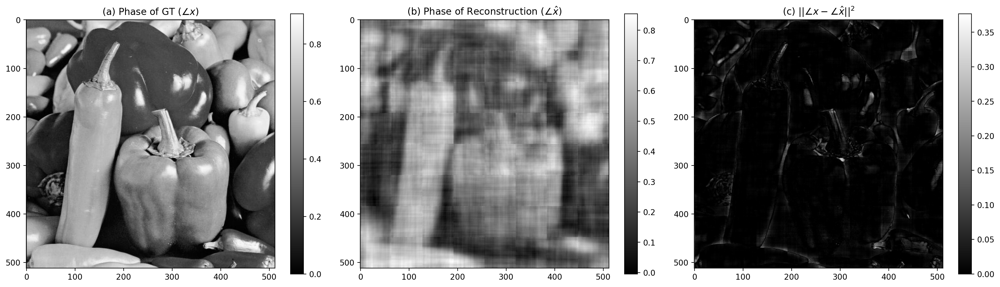

In [17]:
plot_results(model7,image)

0.011435944127723764


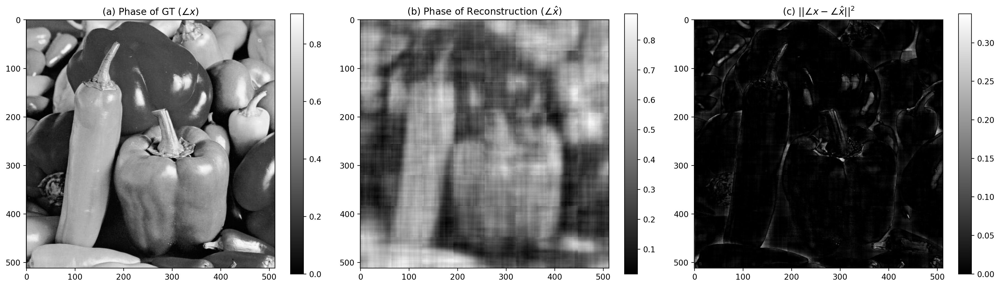

In [18]:
plot_results(model8,image)

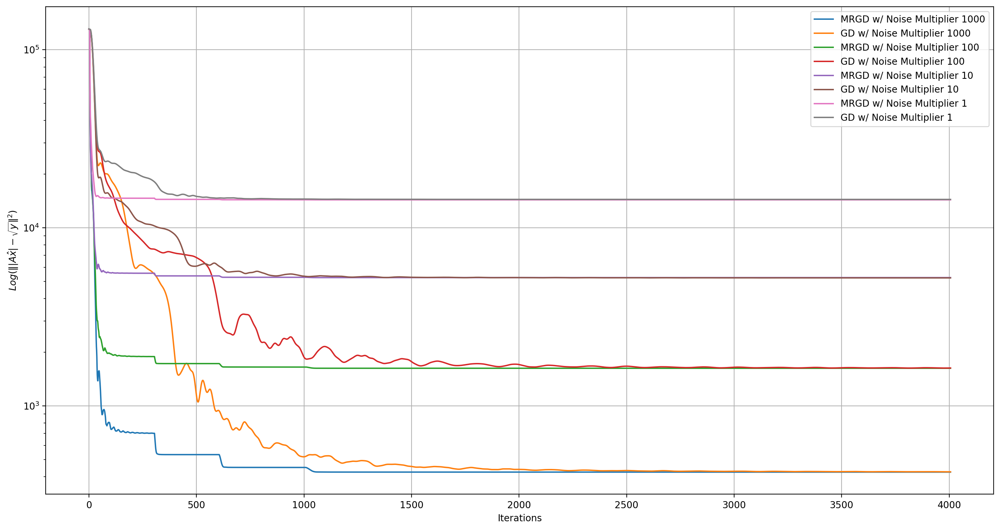

In [20]:
def extract_data(nested_list):
    result = []
    for item in nested_list:
        if isinstance(item, list):  # If the item is a list, recurse into it
            result.extend(extract_data(item))
        else:  # If the item is not a list, add it to the result
            result.append(item)
    return result


plt.figure(figsize=(15, 8),dpi = 200)
plt.semilogy(extract_data(model1.measures["loss"]),label = "MRGD w/ Noise Multiplier 1000")
plt.semilogy(extract_data(model2.measures["loss"]),label = "GD w/ Noise Multiplier 1000")
plt.semilogy(extract_data(model3.measures["loss"]),label = "MRGD w/ Noise Multiplier 100")
plt.semilogy(extract_data(model4.measures["loss"]),label = "GD w/ Noise Multiplier 100")
plt.semilogy(extract_data(model5.measures["loss"]),label = "MRGD w/ Noise Multiplier 10")
plt.semilogy(extract_data(model6.measures["loss"]),label = "GD w/ Noise Multiplier 10")
plt.semilogy(extract_data(model7.measures["loss"]),label = "MRGD w/ Noise Multiplier 1")
plt.semilogy(extract_data(model8.measures["loss"]),label = "GD w/ Noise Multiplier 1")
plt.xlabel("Iterations")
plt.ylabel(r"$Log(\||A\hat{x}|-\sqrt{y}\|^2)$")
plt.grid()
plt.tight_layout()
plt.legend()
plt.savefig("nnfigs/comp_overlap.png")


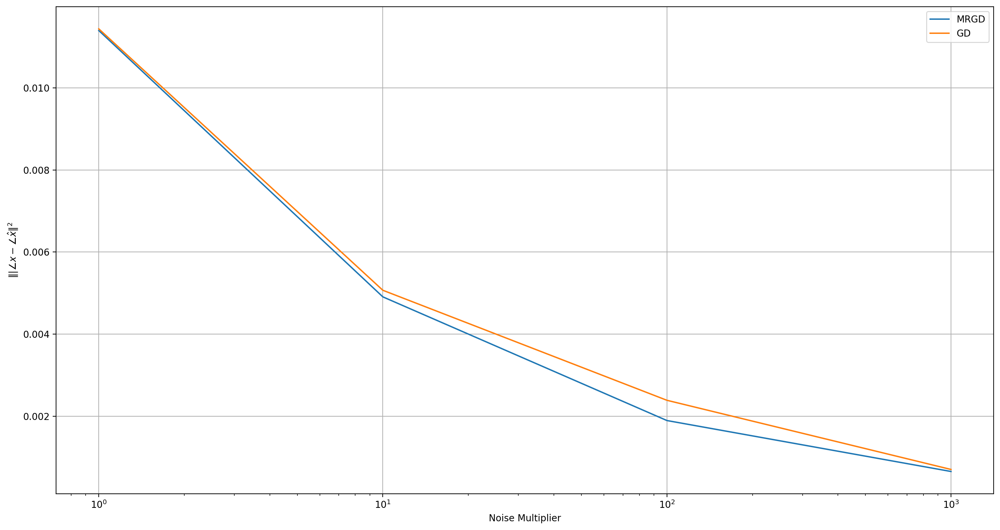

In [22]:
list1 = [0.0006575015672963765,
         0.0018981690178624703,
         0.004909739408494425,
         0.011395460307022662
         ]
list2 = [0.0007071772265379125,
         0.002391191384241495,
         0.005070232348039862,
         0.011435944127723764
         ]
noise_list = [1000,100,10,1]    


plt.figure(figsize=(15, 8),dpi = 200)
plt.semilogx(noise_list,list1,label = "MRGD")
plt.semilogx(noise_list,list2,label = "GD")
plt.xlabel("Noise Multiplier")
plt.ylabel(r"$\||\angle x - \angle \hat{x}\|^2$")
plt.grid()
plt.tight_layout()
plt.legend()
